# Project 4: Advanced Lane Detection
In this project, I will use the knowledge all I have learned from this lession to complete an advanced lane detection function that includes:
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.
- Defined color transforms and gradients function, and find a combined method function to create a thresholded binary image.
- Apply a perspective transform to rectify binary image ("birds-eye view").
- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.
- Finally, Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Step 0: Import  library 
Import the all library of python that will be applying

In [3]:
import os
import cv2
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mping

# Import video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Step 1: Camera Calibration with OpenCV
Sub step 1: load and show the chessboard images 

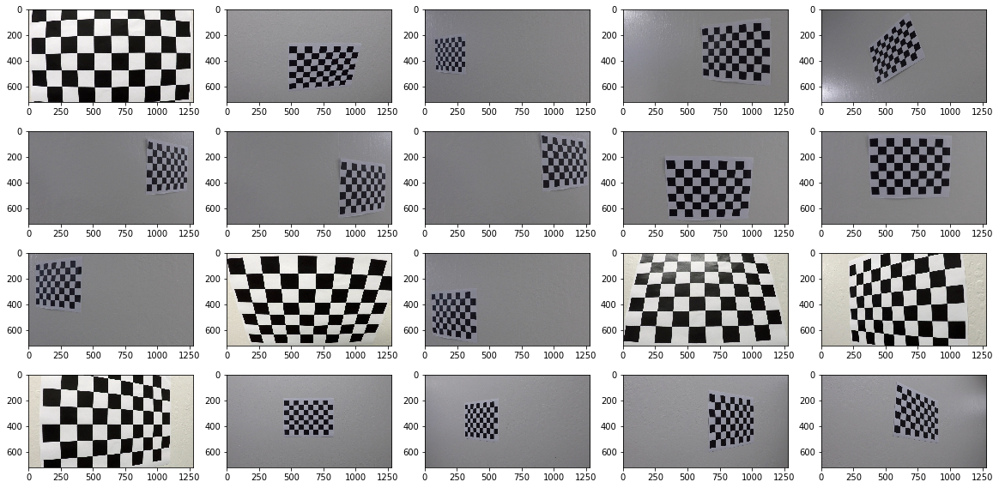

In [4]:
%matplotlib inline
images = glob.glob("camera_cal/calibration*.jpg")

plt.figure(figsize=(20, 10))

for idx, fname in enumerate(images):
    img = plt.imread(fname)
        
    plt.subplot(len(images)//5, 5, idx+1)
    plt.imshow(img)

Sub step 2: extract object points and image points for camera calibration using the 6x9 chessboard, then calibrate the camera

In [5]:
%matplotlib qt
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
NUM_XCOR = 9
NUM_YCOR = 6
objp = np.zeros((NUM_YCOR*NUM_XCOR,3), np.float32)
objp[:,:2] = np.mgrid[0:NUM_XCOR, 0:NUM_YCOR].T.reshape(-1,2)

# Arrays to store object points and image points
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (NUM_XCOR, NUM_YCOR), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw the corners
        cv2.drawChessboardCorners(img, (NUM_XCOR, NUM_YCOR), corners, ret)
        cv2.imshow('chessboard images', img)
        cv2.waitKey(500)
        
cv2.destroyAllWindows()

# Do camera calibration given object points and image points
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Save the calibration result for later use
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_dist.p", "wb" ) )

## Step 2: Undistort the Image
define the undistort function test this function with chessboard images

In [6]:
def undistort_func(img, mtx=mtx, dist=dist):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

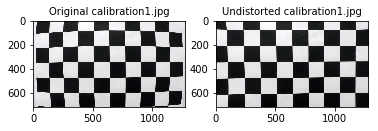

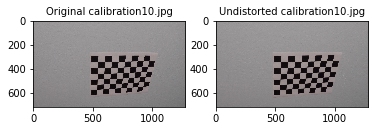

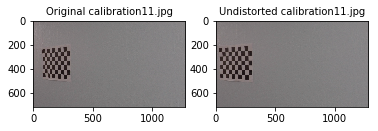

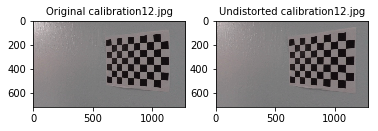

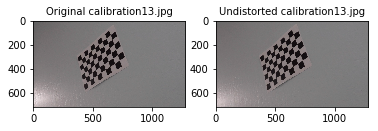

...

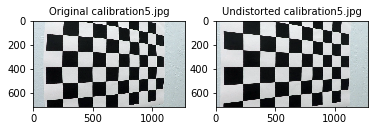

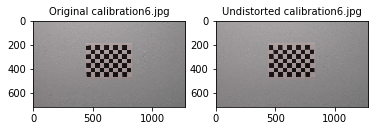

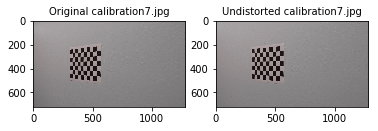

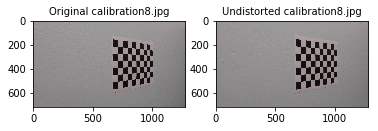

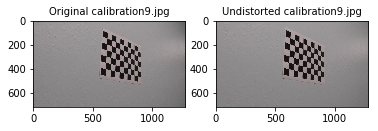

In [7]:
%matplotlib inline

# for loop for displaying calibration images side by side
cal_images = glob.glob('camera_cal/calibration*.jpg')
plt.figure(figsize=(40, 20))
for fname in cal_images:
    img = cv2.imread(fname)
    dst = undistort_func(img)
    cv2.imwrite('output_images/undistorted_'+fname.replace('camera_cal/', ''), dst)
    
    f, (ax1, ax2) = plt.subplots(1, 2)
    ax1.imshow(img)
    ax1.set_title('Original '+fname.replace('camera_cal/', ''), fontsize=10)
    ax2.imshow(dst)
    ax2.set_title('Undistorted '+fname.replace('camera_cal/', ''), fontsize=10)
    

## Step 3: Gradient transform and color transform
define some functions aboat the gradient and color threshold

In [8]:
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_thresh(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    return binary_output

def s_channel_trans(img, s_thresh=(170, 255)):
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    return s_binary

## Step 4: Perspective Transformation
apply perspective transformation on provided image to gain a birds-eye-view besed on the source and destination image points

In [1]:
# Define source and destination points for the perspective transform 
def get_warp_points(image):
    image_height = image.shape[0]
    image_width = image.shape[1]
   
    src = np.float32([[580, 460], [700, 460], [1040, 680], [300, 680]])
    dst = np.float32([[260, 0], [1040, 0], [1040, 720], [260, 720]])
    
    return src, dst

def warp_image(img, src_point, dst_point, img_size):
    M = cv2.getPerspectiveTransform(src_point, dst_point)
    Minv = cv2.getPerspectiveTransform(dst_point, src_point)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

True

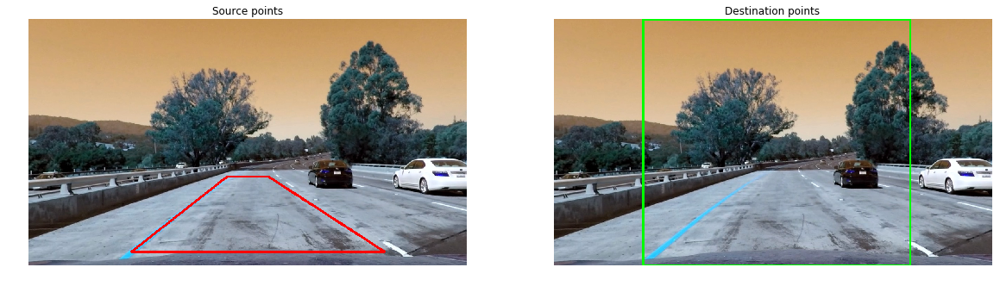

In [9]:
# Then test perspective transfrm

image = cv2.imread("test_images/test1.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = undistort_func(image)
src, dst = get_warp_points(image)

# Plot the chosen source and destination points on the original image
points_image_src = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
points_image_dst = points_image_src.copy()


src_pts = src.reshape((-1, 1, 2)).astype("int32")
cv2.polylines(points_image_src, [src_pts], True, (255, 0, 0), thickness=5)

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.imshow(points_image_src)
plt.title("Source points")
plt.axis("off")
cv2.imwrite("output_images/source_points.jpg", points_image_src)

dst_pts = dst.reshape((-1, 1, 2)).astype("int32")
cv2.polylines(points_image_dst, [dst_pts], True, (0, 255, 0), thickness=5)

plt.subplot(1, 2, 2)
plt.imshow(points_image_dst)
plt.title("Destination points")
plt.axis("off")
cv2.imwrite("output_images/destination_points.jpg", points_image_dst)

Now apply those function on a test image.

True

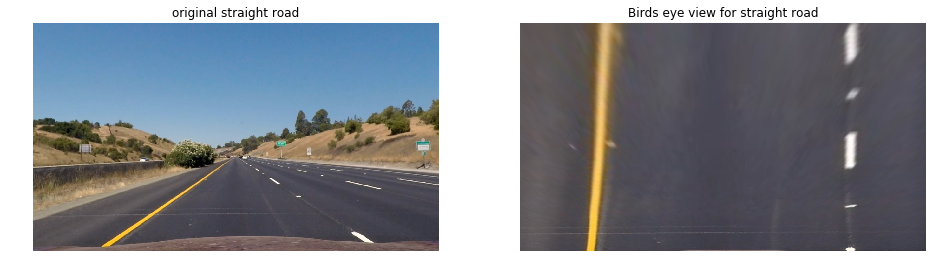

In [10]:
# Read in the same test image as used above and plot
image1 = cv2.imread("test_images/straight_lines1.jpg")
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image1 = undistort_func(image1, mtx, dist)
src, dst = get_warp_points(image1)
warped1, _, _ = warp_image(image1, src, dst, (image.shape[1], image.shape[0]))
cv2.imwrite("output_images/warped_straight_lines1.jpg", warped1)

plt.figure(figsize=(16,8))
plt.subplot(1, 2, 1)
plt.imshow(image1)
plt.title("original straight road");
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(warped1)
plt.title("Birds eye view for straight road");
plt.axis("off")

# Read in an image with straight lane lines to check the warped lines are parallel
image2 = cv2.imread("test_images/test2.jpg")
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

image2 = undistort_func(image2, mtx, dist)
warped2, _, _ = warp_image(image2, src, dst, (image2.shape[1], image2.shape[0]))
cv2.imwrite("output_images/warped_test2.jpg", warped2)

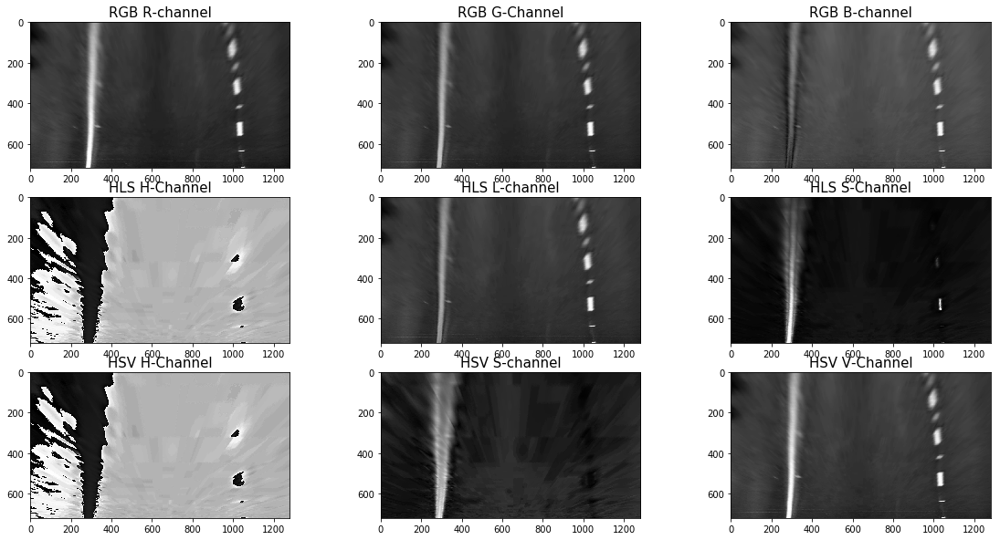

In [10]:
# display color effect on image1 above code cell
image1_R = warped1[:,:,0]
image1_G = warped1[:,:,1]
image1_B = warped1[:,:,2]

image1_HLS = cv2.cvtColor(warped1, cv2.COLOR_RGB2HLS)
image1_H = image1_HLS[:,:,0]
image1_L = image1_HLS[:,:,1]
image1_S = image1_HLS[:,:,2]

image1_HSV = cv2.cvtColor(warped1, cv2.COLOR_RGB2HSV)
image1_H2 = image1_HSV[:,:,0]
image1_S2 = image1_HSV[:,:,1]
image1_V = image1_HSV[:,:,2]

fig, axs = plt.subplots(3,3, figsize=(20, 10))
fig.subplots_adjust(hspace = .2, wspace=.1)
axs = axs.ravel()
axs[0].imshow(image1_R, cmap='gray')
axs[0].set_title('RGB R-channel', fontsize=15)
axs[1].imshow(image1_G, cmap='gray')
axs[1].set_title('RGB G-Channel', fontsize=15)
axs[2].imshow(image1_B, cmap='gray')
axs[2].set_title('RGB B-channel', fontsize=15)
axs[3].imshow(image1_H, cmap='gray')
axs[3].set_title('HLS H-Channel', fontsize=15)
axs[4].imshow(image1_L, cmap='gray')
axs[4].set_title('HLS L-channel', fontsize=15)
axs[5].imshow(image1_S, cmap='gray')
axs[5].set_title('HLS S-Channel', fontsize=15)
axs[6].imshow(image1_H2, cmap='gray')
axs[6].set_title('HSV H-Channel', fontsize=15)
axs[7].imshow(image1_S2, cmap='gray')
axs[7].set_title('HSV S-channel', fontsize=15)
axs[8].imshow(image1_V, cmap='gray')
axs[8].set_title('HSV V-Channel', fontsize=15)

## Apply gradient threshold

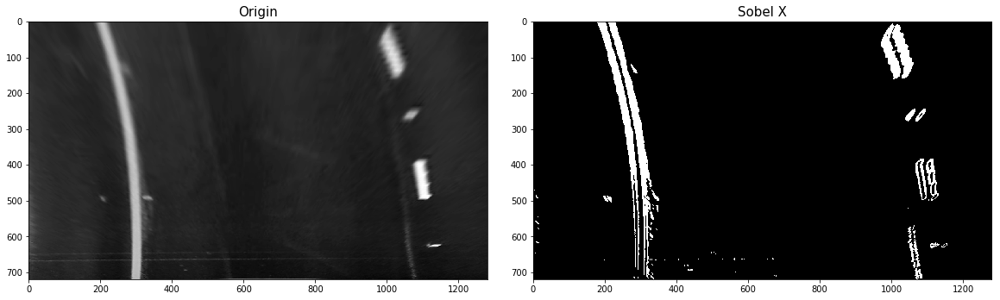

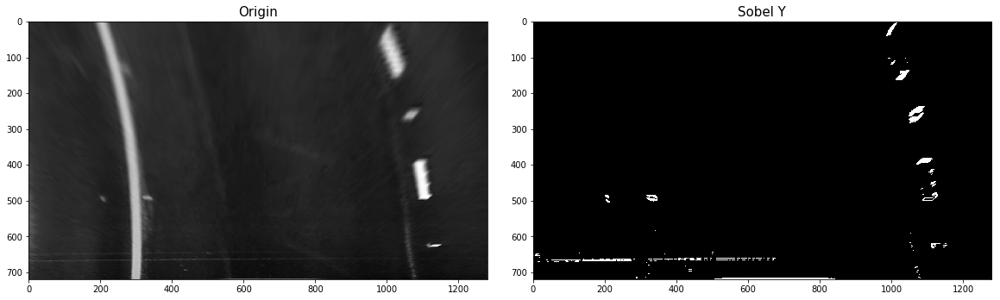

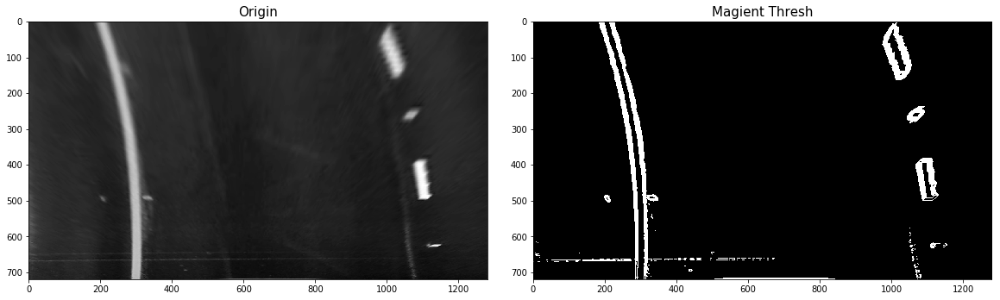

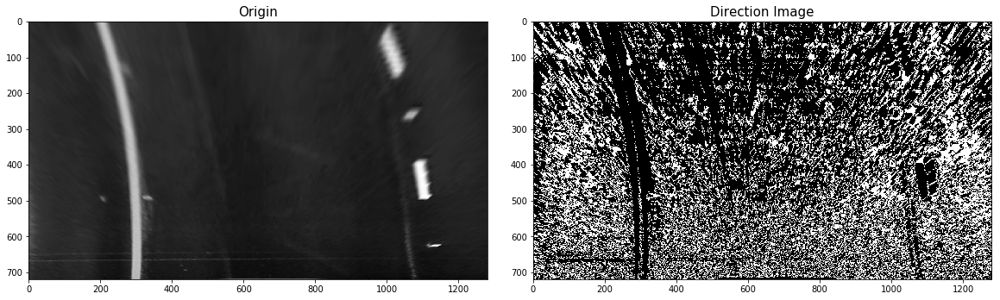

In [42]:
warped2_gray = cv2.cvtColor(warped2, cv2.COLOR_RGB2GRAY)
warped2_absx = abs_sobel_thresh(warped2_gray, orient='x', sobel_kernel=9, thresh=(20, 100))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2_gray, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_absx, cmap='gray')
ax2.set_title('Sobel X', fontsize=15)

warped2_absy = abs_sobel_thresh(warped2_gray, orient='y', sobel_kernel=9, thresh=(20, 100))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2_gray, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_absy, cmap='gray')
ax2.set_title('Sobel Y', fontsize=15)

warped2_mag = mag_thresh(warped2_gray, sobel_kernel=9, mag_thresh=(20, 100))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2_gray, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_mag, cmap='gray')
ax2.set_title('Magient Thresh', fontsize=15)

warped2_dir = dir_thresh(warped2_gray, sobel_kernel=9, thresh=(0.7, 1.3))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2_gray, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_dir, cmap='gray')
ax2.set_title('Direction Image', fontsize=15)

## Define some color space threshod functions

In [12]:
def hls_channel(img, channel='h', thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    if channel == 'h':
        img_channel = hls[:,:,0]
    elif channel == 'l':
        img_channel = hls[:,:,1]
    else:
        img_channel = hls[:,:,2]
    
    img_channel = img_channel*(255/np.max(img_channel))
    
    # Threshold color channel
    binary = np.zeros_like(img_channel)
    binary[(img_channel >= thresh[0]) & (img_channel <= thresh[1])] = 1
    return binary

def rgb_channel(img, channel='r', thresh=(0, 255)):
    if channel == 'r':
        img_channel = img[:,:,0]
    elif channel == 'g':
        img_channel = img[:,:,1]
    else:
        img_channel = img[:,:,2]
    
    img_channel = img_channel*(255/np.max(img_channel))
    
    # Threshold color channel
    binary = np.zeros_like(img_channel)
    binary[(img_channel >= thresh[0]) & (img_channel <= thresh[1])] = 1
    return binary

def hsv_channel(img, channel='h', thresh=(0, 255)):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    if channel == 'h':
        img_channel = hsv[:,:,0]
    elif channel == 's':
        img_channel = hsv[:,:,1]
    else:
        img_channel = hsv[:,:,2]
        
    img_channel = img_channel*(255/np.max(img_channel))
    
    # Threshold color channel
    binary = np.zeros_like(img_channel)
    binary[(img_channel >= thresh[0]) & (img_channel <= thresh[1])] = 1
    return binary

def lab_channel(img, channel='l', thresh=(0, 255)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab).astype(np.float)
    if channel == 'l':
        img_channel = lab[:,:,0]
    elif channel == 'a':
        img_channel = lab[:,:,1]
    else:
        img_channel = lab[:,:,2]
    
    # Threshold color channel
    binary = np.zeros_like(img_channel)
    binary[(img_channel >= thresh[0]) & (img_channel <= thresh[1])] = 1
    return binary

## HLS threshod application 
As shown below， S-channel is better

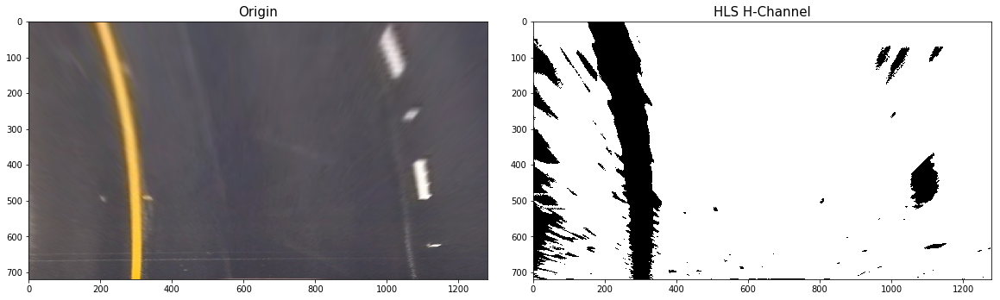

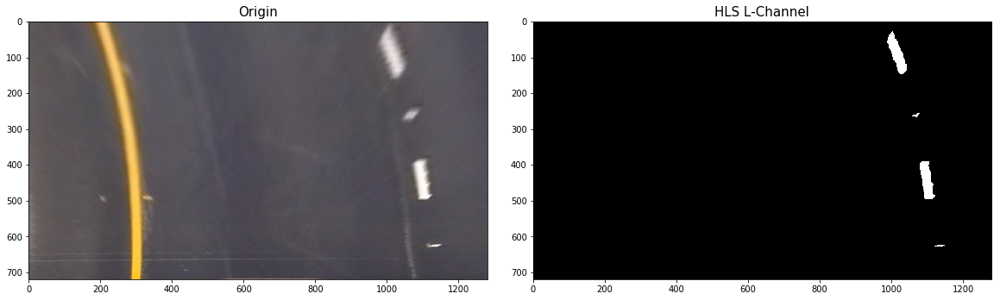

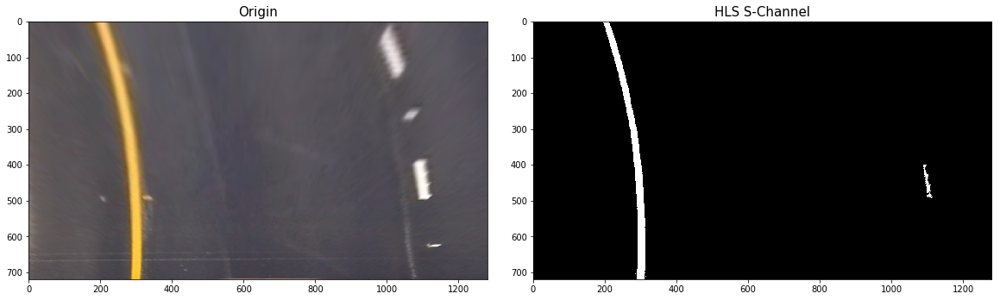

In [41]:
warped2_hls_h = hls_channel(warped2, channel='h', thresh=(170, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_hls_h, cmap='gray')
ax2.set_title('HLS H-Channel', fontsize=15)

warped2_hls_l = hls_channel(warped2, channel='l', thresh=(190, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_hls_l, cmap='gray')
ax2.set_title('HLS L-Channel', fontsize=15)

warped2_hls_s = hls_channel(warped2, channel='s', thresh=(170, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_hls_s, cmap='gray')
ax2.set_title('HLS S-Channel', fontsize=15)

## HLS threshod application 

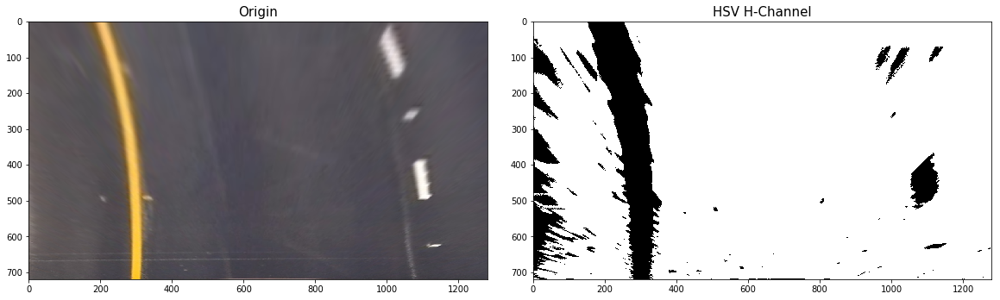

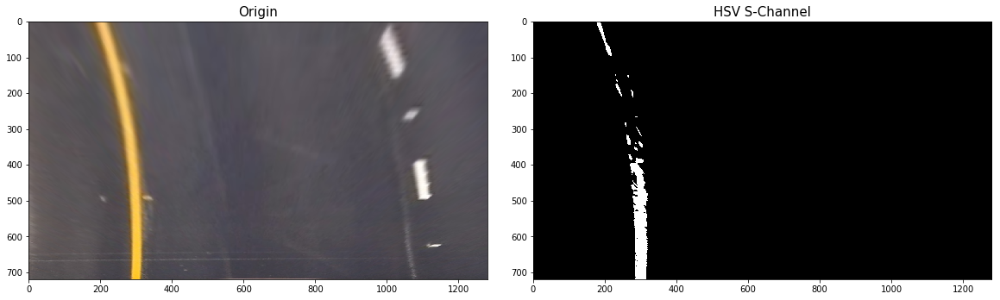

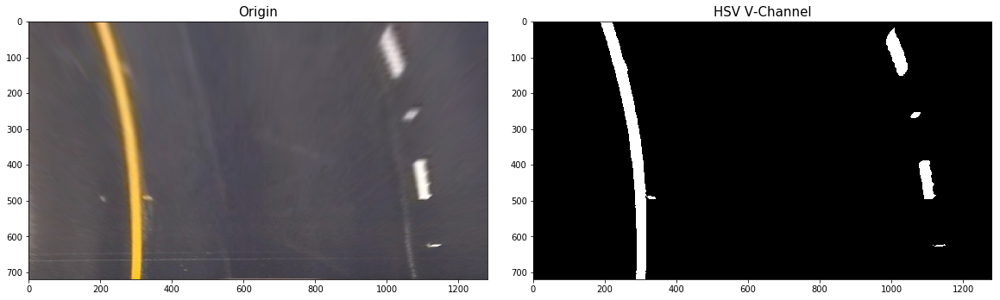

In [14]:
warped2_hsv_h = hsv_channel(warped2, channel='h', thresh=(170, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_hsv_h, cmap='gray')
ax2.set_title('HSV H-Channel', fontsize=15)

warped2_hsv_s = hsv_channel(warped2, channel='s', thresh=(170, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_hsv_s, cmap='gray')
ax2.set_title('HSV S-Channel', fontsize=15)

warped2_hsv_v = hsv_channel(warped2, channel='v', thresh=(170, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_hsv_v, cmap='gray')
ax2.set_title('HSV V-Channel', fontsize=15)

## LAB threshod application 

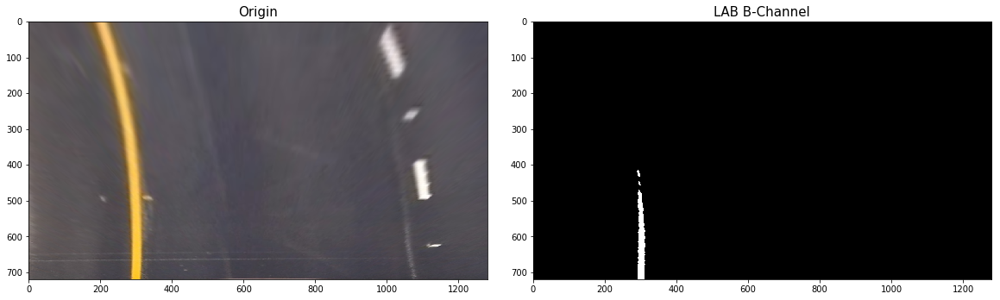

In [15]:
warped2_lab_b = lab_channel(warped2, channel='b', thresh=(190, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(warped2, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(warped2_lab_b, cmap='gray')
ax2.set_title('LAB B-Channel', fontsize=15)

## The whole pipeline
Use all of the method up to detect the road lines.
As described befor， HLS L-channel is better in detecting white line while LAB B-channel is better in detecting yellow line，and the red value is high both for yellow and white pixels, so I will combined them together.

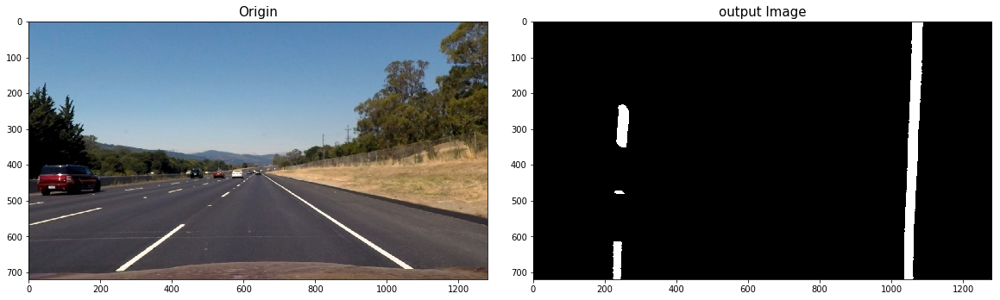

In [89]:
image_combine = cv2.imread("test_images/straight_lines2.jpg")
image_combine = cv2.cvtColor(image_combine, cv2.COLOR_BGR2RGB)
image_combine = undistort_func(image_combine, mtx, dist)
image_combine_warped, _, _ = warp_image(image_combine, src, dst, (image_combine.shape[1], image_combine.shape[0]))

image_combine_hls_binary = hls_channel(image_combine_warped, channel='s', thresh=(220, 255))
image_combine_lab_binary = lab_channel(image_combine_warped, channel='b', thresh=(180, 255))
image_combine_rgb_binary = rgb_channel(image_combine_warped, channel='r', thresh=(180, 255))


image_combine_channel_binary = np.zeros_like(image_combine_hls_binary)
image_combine_channel_binary[(image_combine_hls_binary == 1) | (image_combine_lab_binary == 1) | (image_combine_rgb_binary == 1)] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(image_combine, cmap='gray')
ax1.set_title('Origin', fontsize=15)
ax2.imshow(image_combine_channel_binary, cmap='gray')
ax2.set_title('output Image', fontsize=15)

In [121]:
def combine_binary_func(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    absx = abs_sobel_thresh(gray, orient='x', sobel_kernel=9, thresh=(20, 100))
    absy = abs_sobel_thresh(gray, orient='y', sobel_kernel=9, thresh=(20, 100))
    magnitude = mag_thresh(gray, sobel_kernel=9, mag_thresh=(50, 255))
    direction = dir_thresh(gray, sobel_kernel=9, thresh=(0.7, 1.3))
    gradient = np.zeros_like(gray)
    
    hls_binary = hls_channel(image, channel='s', thresh=(220, 255))
    lab_binary = lab_channel(image, channel='b', thresh=(180, 255))
    rgb_binary = rgb_channel(image, channel='r', thresh=(180, 255))
    
    channel_binary = np.zeros_like(lab_binary)
    channel_binary[(hls_binary == 1) | (lab_binary == 1) | (rgb_binary == 1)] = 1
    
    
    # Stack each channel to view their individual contributions in green and blue respectively,it returns a stack of the two binary images, whose components can see as different colors
    color_binary = np.dstack((np.zeros_like(gradient), gradient, channel_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(gradient)
    combined_binary[(channel_binary == 1) | (gradient == 1)] = 1

    return color_binary, combined_binary

def pipeline(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undistorted_img = undistort_func(image, mtx, dist)
    warped_img, M, Minv = warp_image(undistorted_img, src, dst, (undistorted_img.shape[1], undistorted_img.shape[0]))
    color_binary, combined_binary = combine_binary_func(warped_img)
    return combined_binary, Minv, color_binary

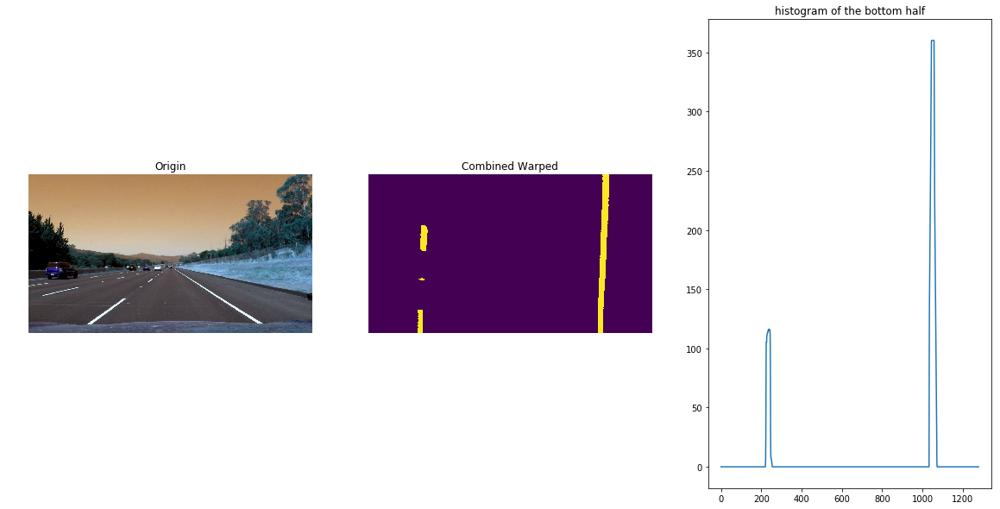

In [98]:
# test the pipeline uppon
img = cv2.imread("test_images/straight_lines2.jpg")

combined_binary, _, _ = pipeline(img)
    
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title("Origin")
ax1.imshow(img)
ax1.axis("off")
    
ax2.set_title("Combined Warped")
ax2.imshow(combined_binary)
ax2.axis("off")

# Take a histogram of the bottom half of the image
histogram = np.sum(combined_binary[np.int(combined_binary.shape[0]/2):,:], axis=0)
plt.plot(histogram)
ax3.set_title("histogram of the bottom half")

## Step 5: Find the lane lines
Implement Sliding Windows and Fit a Polynomial to Find the lane lines and get the curvature of them

In [113]:
def get_curvature(leftx, lefty, rightx, righty, ploty, image_size):
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 25/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/825 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate Lane Deviation from center of lane:
    # First we calculate the intercept points at the bottom of our image, then use those to 
    # calculate the lane deviation of the vehicle (assuming camera is in center of vehicle)
    scene_height = image_size[0] * ym_per_pix
    scene_width = image_size[1] * xm_per_pix
    
    left_intercept = left_fit_cr[0] * scene_height ** 2 + left_fit_cr[1] * scene_height + left_fit_cr[2]
    right_intercept = right_fit_cr[0] * scene_height ** 2 + right_fit_cr[1] * scene_height + right_fit_cr[2]
    calculated_center = (left_intercept + right_intercept) / 2.0
    
    lane_deviation = (calculated_center - scene_width / 2.0)
    
    return left_curverad, right_curverad, lane_deviation

def find_lane_lines(binary_warped, visual=False):
    
    if visual == True:
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        if visual == True:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 2)
            cv2.rectangle(out_img, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 2)
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_curverad, right_curverad, lane_deviation = get_curvature(leftx, lefty, rightx, righty, ploty, binary_warped.shape)
    
    if visual == True:
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        return left_fitx, right_fitx, ploty, left_fit, right_fit, left_curverad, right_curverad, lane_deviation, out_img
    else:
        return left_fitx, right_fitx, ploty, left_fit, right_fit, left_curverad, right_curverad, lane_deviation

Now we can apply this function on the test image.

True

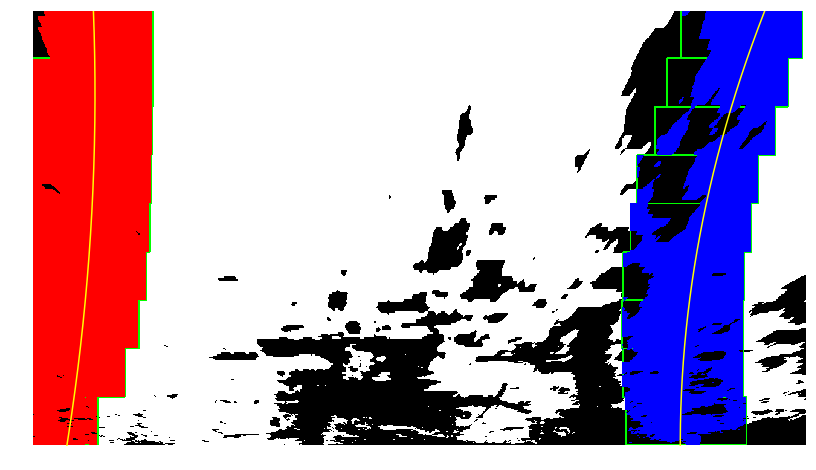

In [122]:
img = cv2.imread("test_images/test1.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

undistorted_img = undistort_func(img, mtx, dist)
color_binary, combined_binary = combine_binary_func(undistorted_img)
combined_binary_warped, _, Minv = warp_image(combined_binary, src, dst, (img.shape[1], img.shape[0]))
left_fitx, right_fitx, ploty, left_fit, right_fit, left_curverad, right_curverad, lane_deviation, out_img = find_lane_lines(combined_binary_warped, visual=True)

plt.figure(figsize=(16,8))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.axis("off")

# save image
cv2.imwrite("output_images/bad_line_find.jpg", out_img)

Now combined another combination：the sobel x、sobel y、magnitude of the gradient、direction and color threshold to get a better result.

True

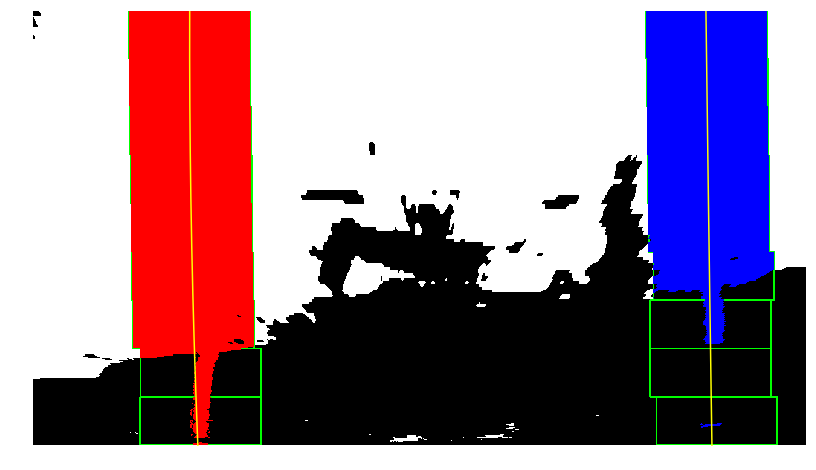

In [115]:
img = cv2.imread("test_images/test4.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

undistorted_img = undistort_func(img, mtx, dist)
color_binary, combined_binary = combine_binary_func(undistorted_img)
combined_binary_warped, _, Minv = warp_image(combined_binary, src, dst, (img.shape[1], img.shape[0]))
left_fitx, right_fitx, ploty, left_fit, right_fit, left_curverad, right_curverad, lane_deviation, out_img = find_lane_lines(combined_binary_warped, visual=True)

plt.figure(figsize=(16,8))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.axis("off")

# save image
cv2.imwrite("output_images/good_line_find.jpg", out_img)

## Step 6: Draw the Detected Line on the Origin Image

In [92]:
def draw_lanes_on_image(binary_warped, undistorted_img, Minv, left_fitx, right_fitx, ploty, left_radius, right_radius, lane_deviation):
    
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted_img.shape[1], undistorted_img.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted_img, 1, newwarp, 0.4, 0)
    
    curvature_text = "Curvature: Left = " + str(np.round(left_radius, 2)) + ", Right = " + str(np.round(right_radius, 2)) 
    cv2.putText(result, curvature_text, (30, 60), cv2.FONT_HERSHEY_COMPLEX, 0.8, (255, 255, 255), 2)
    deviation_text = "Lane deviation from center = {:.2f} m".format(lane_deviation)
    cv2.putText(result, deviation_text, (30, 90), cv2.FONT_HERSHEY_COMPLEX, 0.8, (255, 255, 255), 2)
        
    return result

True

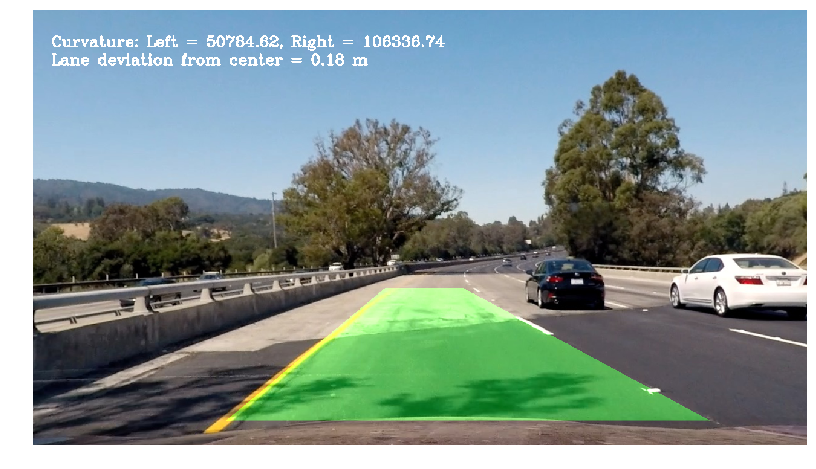

In [23]:
result = draw_lanes_on_image(combined_binary_warped, undistorted_img, Minv, left_fitx, right_fitx, ploty, left_curverad, right_curverad, lane_deviation)
plt.figure(figsize=(16,8))
plt.imshow(result)
plt.axis("off")

# save to file
binary = 255 * result.astype("uint8")
cv2.imwrite("output_images/final_result.jpg", result)

##  Image process pipeline

In [116]:
def process_image(image):
    undistorted_img = undistort_func(image, mtx, dist)
    undistorted_img = cv2.GaussianBlur(undistorted_img,(5,5),0);
    color_binary, combined_binary = combine_binary_func(undistorted_img)
    combined_binary, _, Minv = warp_image(combined_binary, src, dst, (image.shape[1], image.shape[0]))
    
    left_fitx, right_fitx, ploty, _, _, left_curverad, right_curverad, lane_deviation = find_lane_lines(combined_binary)
    lane_lines_img = draw_lanes_on_image(combined_binary, undistorted_img, Minv, left_fitx, right_fitx, ploty, left_curverad, right_curverad, lane_deviation)
    return lane_lines_img

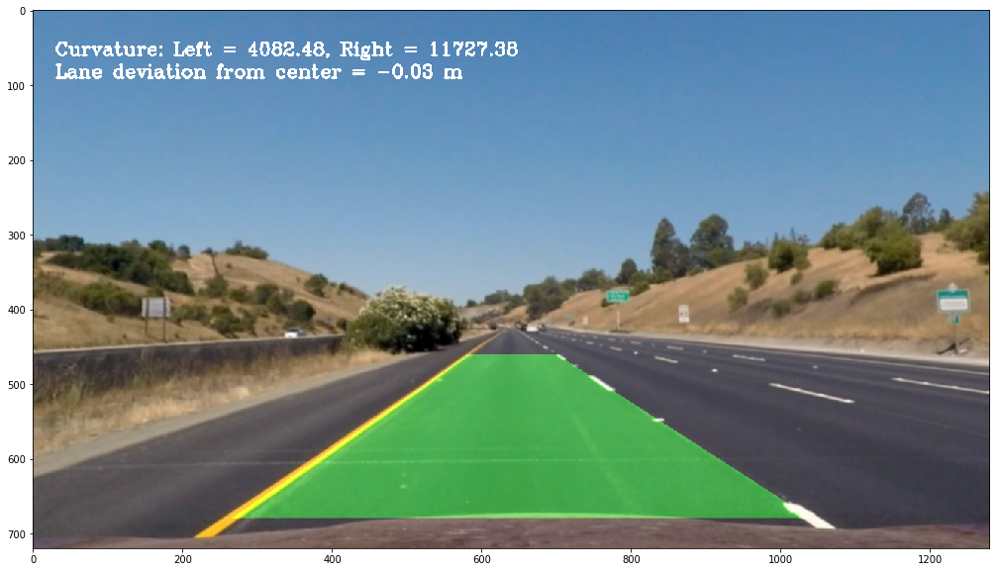

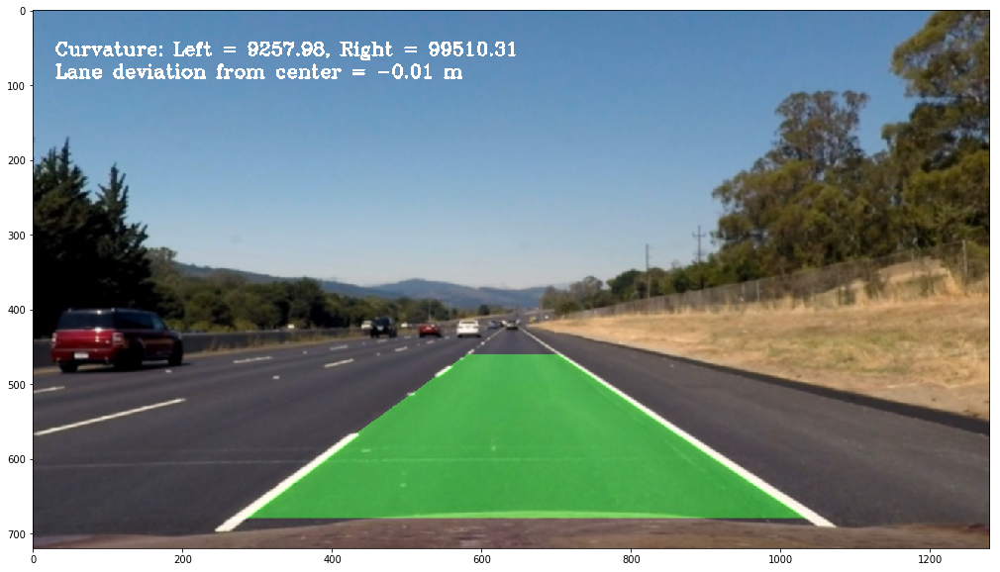

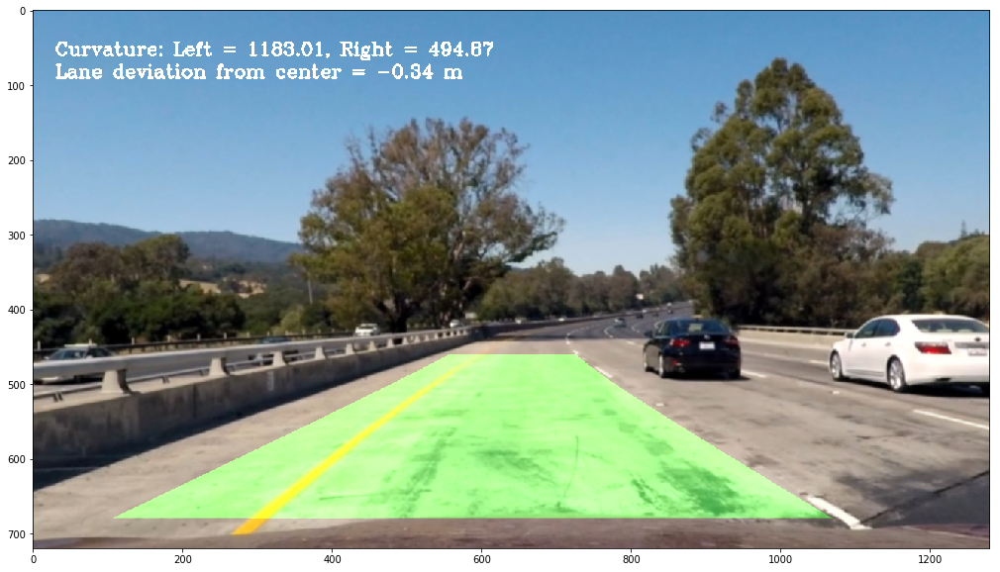

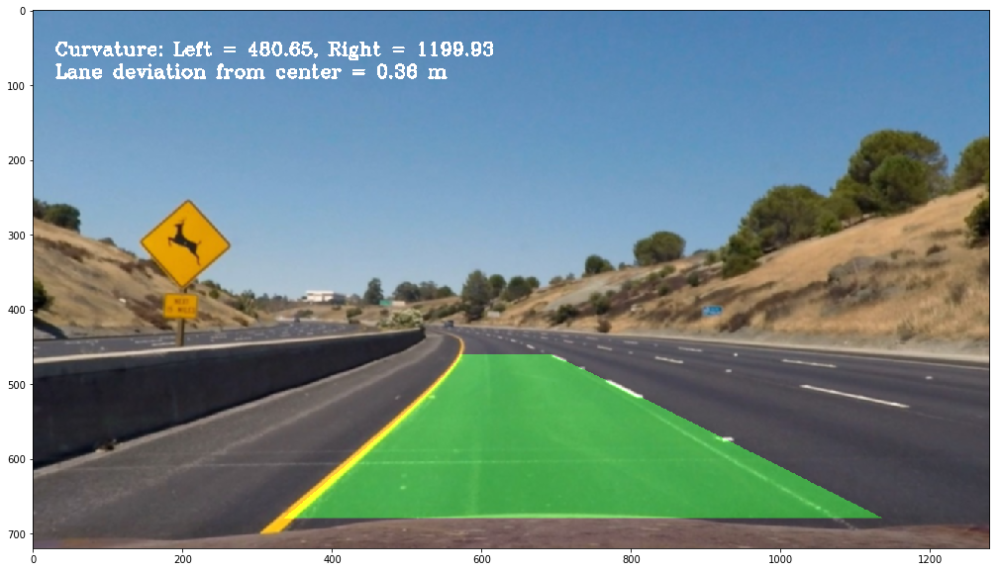

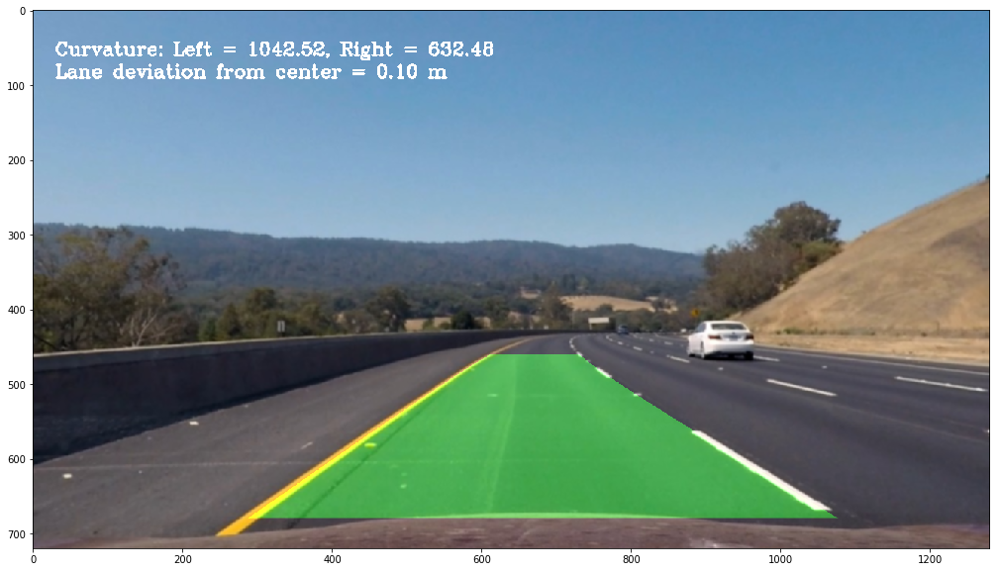

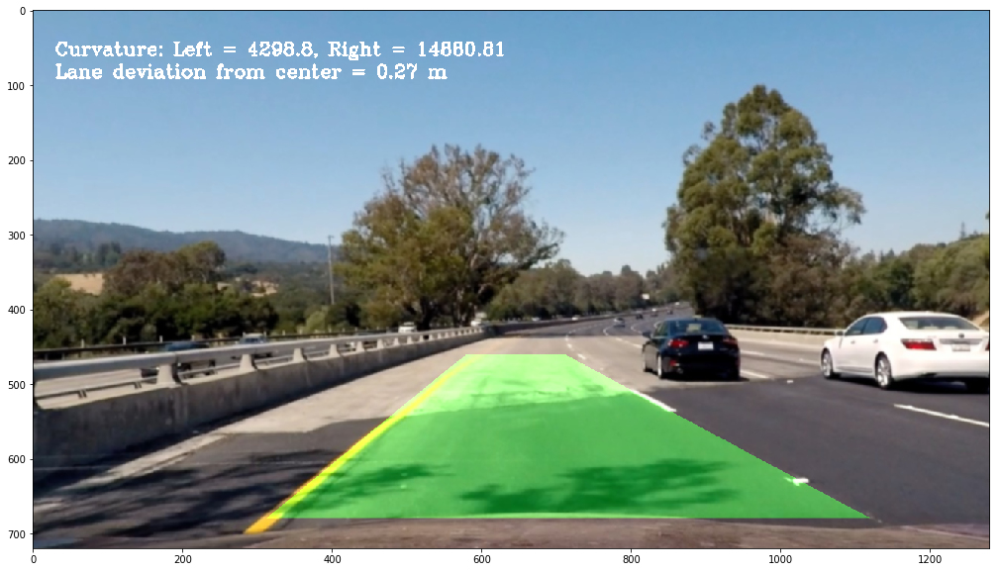

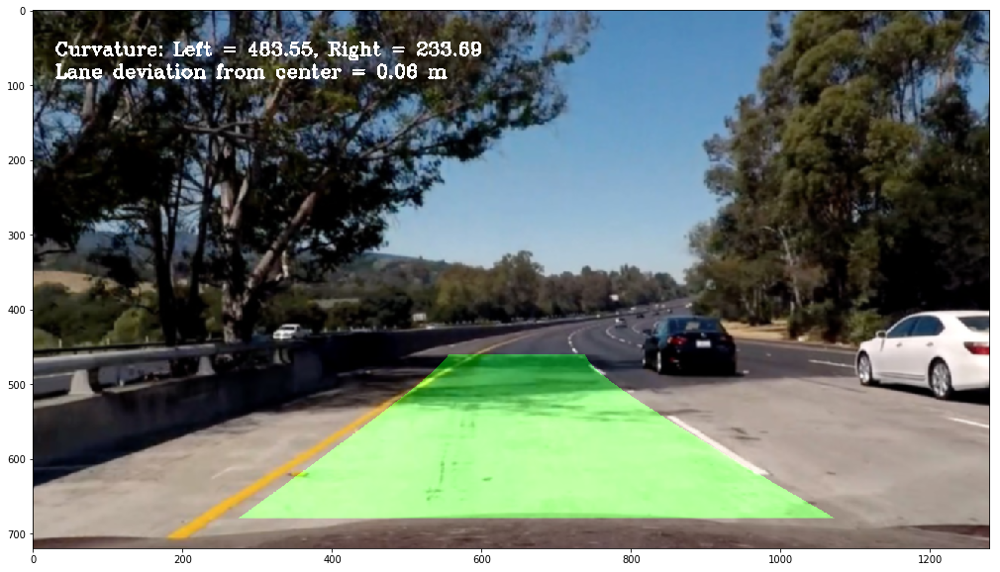

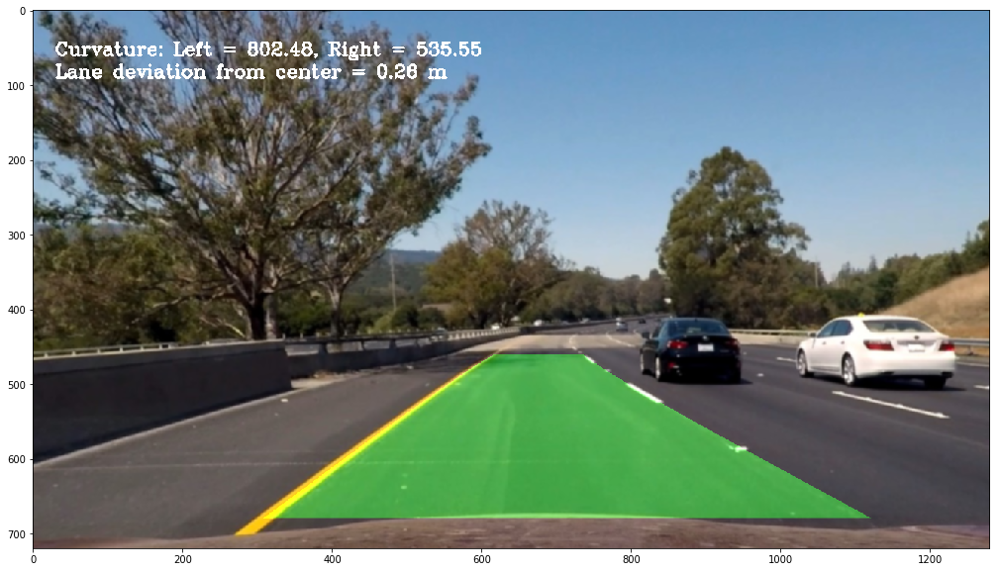

In [123]:
# run on the test images
files = os.listdir('./test_images')
files = [ './test_images/{}'.format(file) for file in files ]
for file in files:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    result = process_image(img)

    plt.figure(figsize=(20,10))
    plt.imshow(result)

## Step 7: Video process pipeline

In [124]:
video_output = "project_video_output.mp4"
clip1 = VideoFileClip("project_video.mp4")
clip1_output = clip1.fl_image(process_image)  
%time clip1_output.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



 12%|█▏        | 152/1261 [00:43<05:16,  3.50it/s]


 24%|██▍       | 303/1261 [01:26<04:31,  3.53it/s]


 36%|███▌      | 454/1261 [02:09<03:48,  3.53it/s]


 48%|████▊     | 605/1261 [02:54<03:17,  3.33it/s]


 60%|█████▉    | 756/1261 [03:37<02:22,  3.54it/s]


 72%|███████▏  | 907/1261 [04:21<01:52,  3.15it/s]


 84%|████████▍ | 1057/1261 [05:09<00:58,  3.52it/s]


 96%|█████████▌| 1205/1261 [05:53<00:17,  3.28it/s]


100%|█████████▉| 1260/1261 [06:10<00:00,  3.18it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 6min 11s, sys: 1min 32s, total: 7min 43s
Wall time: 6min 10s


In [125]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

## Challenge video


In [28]:
video_challenge_output = "video_challenge_output.mp4"
clip1 = VideoFileClip("challenge_video.mp4")
clip1_output = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time clip1_output.write_videofile(video_challenge_output, audio=False)

[MoviePy] >>>> Building video video_challenge_output.mp4
[MoviePy] Writing video video_challenge_output.mp4


100%|██████████| 485/485 [02:10<00:00,  3.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_challenge_output.mp4 

CPU times: user 2min 15s, sys: 30 s, total: 2min 45s
Wall time: 2min 11s


In [29]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_challenge_output))